#                                                Capstone 4 
# Build a Machine Learning Model to predict Telco Customer Churn

### Completed by: Puah Hwei Koon
### Date: 10 Mar 2023


data source:
https://www.kaggle.com/datasets/shilongzhuang/telecom-customer-churn-by-maven-analytics?resource=download

-----------------------------------------------------------------

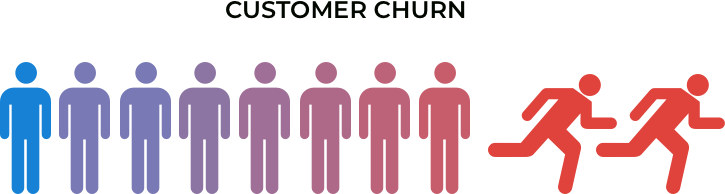

-----------------------------------------------------------------

## 1. Import Library and Initialize Global Variables

In [1]:
# Import essential library packages
import pandas as pd
#import ydata_profiling
#from ydata_profiling import ProfileReport
import numpy as np
import matplotlib.pyplot as plt
%matplotlib inline
from wordcloud import WordCloud
from wordcloud import STOPWORDS
import seaborn as sns
import time
# import tensorflow as tf
import imblearn
print(imblearn.__version__)

# Import relevant functions from Scikit_learn
from sklearn.base import clone
from sklearn.model_selection import train_test_split, GridSearchCV, cross_val_score, KFold
from sklearn.preprocessing import StandardScaler, MinMaxScaler, LabelEncoder
from sklearn.metrics import classification_report, confusion_matrix, accuracy_score, f1_score,\
                            precision_score, recall_score, roc_curve, average_precision_score,\
                            roc_auc_score, make_scorer#,plot_roc_curve, plot_precision_recall_curve
from sklearn.metrics import RocCurveDisplay, PrecisionRecallDisplay,\
                            classification_report, confusion_matrix
from sklearn.linear_model import LogisticRegression
from sklearn.neighbors import KNeighborsClassifier
from sklearn.naive_bayes import GaussianNB
from sklearn.svm import SVC
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier,GradientBoostingClassifier,\
                                AdaBoostClassifier, ExtraTreesClassifier, VotingClassifier
from sklearn.neural_network import MLPClassifier
# from tensorflow import keras
# from tensorflow.keras import layers, Input, Sequential
# from tensorflow.keras.layers import Dense, Dropout, Activation
# from tensorflow.keras.callbacks import EarlyStopping
# #from tensorflow.keras.preprocessing.image import ImageDataGenerator
# from tensorflow.keras.layers import (Conv2D, MaxPooling2D, ZeroPadding2D,
#                                     GlobalAveragePooling2D, Flatten, 
#                                      BatchNormalization)
# from tensorflow.keras import utils

# Import relevant function from xgboost
from xgboost import XGBClassifier

# Import relevant functions from imblearn
from imblearn.over_sampling import SMOTE
from imblearn.under_sampling import RandomUnderSampler
from imblearn.pipeline import Pipeline

# Set to ignore warnings
import warnings
warnings.filterwarnings('ignore')

# Set up to see more from Pandas functions displaying details
pd.set_option('display.max_rows', 500)
pd.set_option('display.max_columns', 500)
pd.set_option('display.width', 1000)

# Fixed a constant seed number to be used where required
SEED = 41

0.10.1


-----------------------------------------------------------------

## 2. Load Database/Import Data

In [2]:
# Read Dataset
df = pd.read_csv('telecom_customer_churn.csv')

-----------------------------------------------------------------

## 3. Exploratory Data Analysis (EDA)

#### 3.1 EDA - Understand The Data with Descriptive Statistics

In [3]:
# Taking a peek at the raw data, display first 5 rows
df.head()

,Customer ID,Gender,Age,Married,Number of Dependents,City,Zip Code,Latitude,Longitude,Number of Referrals,Tenure in Months,Offer,Phone Service,Avg Monthly Long Distance Charges,Multiple Lines,Internet Service,Internet Type,Avg Monthly GB Download,Online Security,Online Backup,Device Protection Plan,Premium Tech Support,Streaming TV,Streaming Movies,Streaming Music,Unlimited Data,Contract,Paperless Billing,Payment Method,Monthly Charge,Total Charges,Total Refunds,Total Extra Data Charges,Total Long Distance Charges,Total Revenue,Customer Status,Churn Category,Churn Reason
0,0002-ORFBO,Female,37,Yes,0,Frazier Park,93225,34.827662,-118.999073,2,9,None,Yes,42.39,No,Yes,Cable,16.0,No,Yes,No,Yes,Yes,No,No,Yes,One Year,Yes,Credit Card,65.6,593.30,0.00,0,381.51,974.81,Stayed,NaN,NaN
1,0003-MKNFE,Male,46,No,0,Glendale,91206,34.162515,-118.203869,0,9,None,Yes,10.69,Yes,Yes,Cable,10.0,No,No,No,No,No,Yes,Yes,No,Month-to-Month,No,Credit Card,-4.0,542.40,38.33,10,96.21,610.28,Stayed,NaN,NaN
2,0004-TLHLJ,Male,50,No,0,Costa Mesa,92627,33.645672,-117.922613,0,4,Offer E,Yes,33.65,No,Yes,Fiber Optic,30.0,No,No,Yes,No,No,No,No,Yes,Month-to-Month,Yes,Bank Withdrawal,73.9,280.85,0.00,0,134.60,415.45,Churned,Competitor,Competitor had better devices
3,0011-IGKFF,Male,78,Yes,0,Martinez,94553,38.014457,-122.115432,1,13,Offer D,Yes,27.82,No,Yes,Fiber Optic,4.0,No,Yes,Yes,No,Yes,Yes,No,Yes,Month-to-Month,Yes,Bank Withdrawal,98.0,1237.85,0.00,0,361.66,1599.51,Churned,Dissatisfaction,Product dissatisfaction
4,0013-EXCHZ,Female,75,Yes,0,Camarillo,93010,34.227846,-119.079903,3,3,None,Yes,7.38,No,Yes,Fiber Optic,11.0,No,No,No,Yes,Yes,No,No,Yes,Month-to-Month,Yes,Credit Card,83.9,267.40,0.00,0,22.14,289.54,Churned,Dissatisfaction,Network reliability


In [4]:
# Review the dimensions of the data set
df.shape

(7043, 38)

In [5]:
# Display profile report, caution: take time to load data
#df.profile_report()

In [6]:
# Display an overview of 
overview_table = pd.DataFrame({
    "No. Unique": df.nunique(),
    "Missing Value": df.isnull().sum(),
    "NaNN Value": df.isna().sum(),
    "Duplicated": df.duplicated().sum(),
    "Dtype": df.dtypes
})
overview_table


# Check for signs of missing data
# df.isna().any().any()
#df.isna().sum()

,No. Unique,Missing Value,NaNN Value,Duplicated,Dtype
Customer ID,7043,0,0,0,object
Gender,2,0,0,0,object
Age,62,0,0,0,int64
Married,2,0,0,0,object
Number of Dependents,10,0,0,0,int64
City,1106,0,0,0,object
Zip Code,1626,0,0,0,int64
Latitude,1626,0,0,0,float64
Longitude,1625,0,0,0,float64
Number of Referrals,12,0,0,0,int64


In [7]:
 #Summary of data types and missing data info
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 7043 entries, 0 to 7042
Data columns (total 38 columns):
 #   Column                             Non-Null Count  Dtype  
---  ------                             --------------  -----  
 0   Customer ID                        7043 non-null   object 
 1   Gender                             7043 non-null   object 
 2   Age                                7043 non-null   int64  
 3   Married                            7043 non-null   object 
 4   Number of Dependents               7043 non-null   int64  
 5   City                               7043 non-null   object 
 6   Zip Code                           7043 non-null   int64  
 7   Latitude                           7043 non-null   float64
 8   Longitude                          7043 non-null   float64
 9   Number of Referrals                7043 non-null   int64  
 10  Tenure in Months                   7043 non-null   int64  
 11  Offer                              7043 non-null   objec

In [8]:
# Correlation for numerical data (NUMERICAL DATA)
df.corr()

,Age,Number of Dependents,Zip Code,Latitude,Longitude,Number of Referrals,Tenure in Months,Avg Monthly Long Distance Charges,Avg Monthly GB Download,Monthly Charge,Total Charges,Total Refunds,Total Extra Data Charges,Total Long Distance Charges,Total Revenue
Age,1.000000,-0.119000,-0.008183,-0.010305,0.007612,-0.025141,0.009927,-0.020010,-0.566518,0.134511,0.059684,0.024168,0.025036,0.003065,0.048265
Number of Dependents,-0.119000,1.000000,0.016493,0.029081,-0.024271,0.278003,0.108237,-0.002898,0.300802,-0.125649,0.022535,0.014023,-0.014436,0.068966,0.038038
Zip Code,-0.008183,0.016493,1.000000,0.894769,-0.790564,0.001463,0.007146,0.012298,-0.002859,-0.002517,0.001978,-0.003797,-0.014550,0.005063,0.002944
Latitude,-0.010305,0.029081,0.894769,1.000000,-0.885979,0.018715,0.011963,0.014450,-0.013485,-0.021613,-0.002784,-0.009901,-0.013233,0.008029,0.000082
Longitude,0.007612,-0.024271,-0.790564,-0.885979,1.000000,-0.009893,-0.009672,-0.015420,0.015195,0.021052,0.003811,-0.000597,0.010461,-0.006923,0.001062
Number of Referrals,-0.025141,0.278003,0.001463,0.018715,-0.009893,1.000000,0.326975,0.001800,0.080243,0.026301,0.250378,0.024756,0.000350,0.216190,0.261853
Tenure in Months,0.009927,0.108237,0.007146,0.011963,-0.009672,0.326975,1.000000,0.012713,0.038173,0.239065,0.826074,0.059021,0.082266,0.674149,0.853146
Avg Monthly Long Distance Charges,-0.020010,-0.002898,0.012298,0.014450,-0.015420,0.001800,0.012713,1.000000,0.019047,0.019149,0.016946,-0.026072,0.021162,0.548759,0.173072
Avg Monthly GB Download,-0.566518,0.300802,-0.002859,-0.013485,0.015195,0.080243,0.038173,0.019047,1.000000,-0.017283,0.031957,-0.011000,0.015451,0.024101,0.031922
Monthly Charge,0.134511,-0.125649,-0.002517,-0.021613,0.021052,0.026301,0.239065,0.019149,-0.017283,1.000000,0.622810,0.023963,0.121238,0.235685,0.563249


In [9]:
# Display unique values of each column feature (CATEGORICAL DATA)
def unique_values_names(df):
    for column in df:
        if df[column].dtypes == "object":
            print(f"Unique {column}'s count: {df[column].nunique()}")
            print(f"{column.title()}:{df[column].unique()}\n")

unique_values_names(df)

Unique Customer ID's count: 7043
Customer Id:['0002-ORFBO' '0003-MKNFE' '0004-TLHLJ' ... '9992-UJOEL' '9993-LHIEB'
 '9995-HOTOH']

Unique Gender's count: 2
Gender:['Female' 'Male']

Unique Married's count: 2
Married:['Yes' 'No']

Unique City's count: 1106
City:['Frazier Park' 'Glendale' 'Costa Mesa' ... 'Jacumba' 'Carpinteria'
 'Meadow Valley']

Unique Offer's count: 6
Offer:['None' 'Offer E' 'Offer D' 'Offer A' 'Offer B' 'Offer C']

Unique Phone Service's count: 2
Phone Service:['Yes' 'No']

Unique Multiple Lines's count: 2
Multiple Lines:['No' 'Yes' nan]

Unique Internet Service's count: 2
Internet Service:['Yes' 'No']

Unique Internet Type's count: 3
Internet Type:['Cable' 'Fiber Optic' 'DSL' nan]

Unique Online Security's count: 2
Online Security:['No' 'Yes' nan]

Unique Online Backup's count: 2
Online Backup:['Yes' 'No' nan]

Unique Device Protection Plan's count: 2
Device Protection Plan:['No' 'Yes' nan]

Unique Premium Tech Support's count: 2
Premium Tech Support:['Yes' 'No' nan

In [10]:
#Summarize the numerical data using descriptivee statistics (NUMERICAL DATA)
df.describe()

,Age,Number of Dependents,Zip Code,Latitude,Longitude,Number of Referrals,Tenure in Months,Avg Monthly Long Distance Charges,Avg Monthly GB Download,Monthly Charge,Total Charges,Total Refunds,Total Extra Data Charges,Total Long Distance Charges,Total Revenue
count,7043.000000,7043.000000,7043.000000,7043.000000,7043.000000,7043.000000,7043.000000,6361.000000,5517.000000,7043.000000,7043.000000,7043.000000,7043.000000,7043.000000,7043.000000
mean,46.509726,0.468692,93486.070567,36.197455,-119.756684,1.951867,32.386767,25.420517,26.189958,63.596131,2280.381264,1.962182,6.860713,749.099262,3034.379056
std,16.750352,0.962802,1856.767505,2.468929,2.154425,3.001199,24.542061,14.200374,19.586585,31.204743,2266.220462,7.902614,25.104978,846.660055,2865.204542
min,19.000000,0.000000,90001.000000,32.555828,-124.301372,0.000000,1.000000,1.010000,2.000000,-10.000000,18.800000,0.000000,0.000000,0.000000,21.360000
25%,32.000000,0.000000,92101.000000,33.990646,-121.788090,0.000000,9.000000,13.050000,13.000000,30.400000,400.150000,0.000000,0.000000,70.545000,605.610000
50%,46.000000,0.000000,93518.000000,36.205465,-119.595293,0.000000,29.000000,25.690000,21.000000,70.050000,1394.550000,0.000000,0.000000,401.440000,2108.640000
75%,60.000000,0.000000,95329.000000,38.161321,-117.969795,3.000000,55.000000,37.680000,30.000000,89.750000,3786.600000,0.000000,0.000000,1191.100000,4801.145000
max,80.000000,9.000000,96150.000000,41.962127,-114.192901,11.000000,72.000000,49.990000,85.000000,118.750000,8684.800000,49.790000,150.000000,3564.720000,11979.340000


In [11]:
#Understand the relationship in the data set using correlations (NUMERICAL data)
df.corr()

,Age,Number of Dependents,Zip Code,Latitude,Longitude,Number of Referrals,Tenure in Months,Avg Monthly Long Distance Charges,Avg Monthly GB Download,Monthly Charge,Total Charges,Total Refunds,Total Extra Data Charges,Total Long Distance Charges,Total Revenue
Age,1.000000,-0.119000,-0.008183,-0.010305,0.007612,-0.025141,0.009927,-0.020010,-0.566518,0.134511,0.059684,0.024168,0.025036,0.003065,0.048265
Number of Dependents,-0.119000,1.000000,0.016493,0.029081,-0.024271,0.278003,0.108237,-0.002898,0.300802,-0.125649,0.022535,0.014023,-0.014436,0.068966,0.038038
Zip Code,-0.008183,0.016493,1.000000,0.894769,-0.790564,0.001463,0.007146,0.012298,-0.002859,-0.002517,0.001978,-0.003797,-0.014550,0.005063,0.002944
Latitude,-0.010305,0.029081,0.894769,1.000000,-0.885979,0.018715,0.011963,0.014450,-0.013485,-0.021613,-0.002784,-0.009901,-0.013233,0.008029,0.000082
Longitude,0.007612,-0.024271,-0.790564,-0.885979,1.000000,-0.009893,-0.009672,-0.015420,0.015195,0.021052,0.003811,-0.000597,0.010461,-0.006923,0.001062
Number of Referrals,-0.025141,0.278003,0.001463,0.018715,-0.009893,1.000000,0.326975,0.001800,0.080243,0.026301,0.250378,0.024756,0.000350,0.216190,0.261853
Tenure in Months,0.009927,0.108237,0.007146,0.011963,-0.009672,0.326975,1.000000,0.012713,0.038173,0.239065,0.826074,0.059021,0.082266,0.674149,0.853146
Avg Monthly Long Distance Charges,-0.020010,-0.002898,0.012298,0.014450,-0.015420,0.001800,0.012713,1.000000,0.019047,0.019149,0.016946,-0.026072,0.021162,0.548759,0.173072
Avg Monthly GB Download,-0.566518,0.300802,-0.002859,-0.013485,0.015195,0.080243,0.038173,0.019047,1.000000,-0.017283,0.031957,-0.011000,0.015451,0.024101,0.031922
Monthly Charge,0.134511,-0.125649,-0.002517,-0.021613,0.021052,0.026301,0.239065,0.019149,-0.017283,1.000000,0.622810,0.023963,0.121238,0.235685,0.563249


In [12]:
#Revoew the skew of distributions of each attribute
#fig = plt.figure(figsize=(3,3))
sk = pd.DataFrame(df.skew(),columns=['skewness'])
sk

,skewness
Age,0.162186
Number of Dependents,2.109932
Zip Code,-0.209615
Latitude,0.314804
Longitude,-0.091932
Number of Referrals,1.446060
Tenure in Months,0.240543
Avg Monthly Long Distance Charges,-0.001971
Avg Monthly GB Download,1.184056
Monthly Charge,-0.275394


In [13]:
df.columns = df.columns.str.replace(" ", "").str.title()
df.columns

Index(['Customerid', 'Gender', 'Age', 'Married', 'Numberofdependents', 'City', 'Zipcode', 'Latitude', 'Longitude', 'Numberofreferrals', 'Tenureinmonths', 'Offer', 'Phoneservice', 'Avgmonthlylongdistancecharges', 'Multiplelines', 'Internetservice', 'Internettype', 'Avgmonthlygbdownload', 'Onlinesecurity', 'Onlinebackup', 'Deviceprotectionplan', 'Premiumtechsupport', 'Streamingtv', 'Streamingmovies', 'Streamingmusic', 'Unlimiteddata', 'Contract', 'Paperlessbilling', 'Paymentmethod', 'Monthlycharge', 'Totalcharges', 'Totalrefunds', 'Totalextradatacharges', 'Totallongdistancecharges', 'Totalrevenue', 'Customerstatus', 'Churncategory', 'Churnreason'], dtype='object')

In [14]:
# Dealing with the above 12 NULLs - avgmonthlylongdistancecharges, dtypes=float64, fillna with '0.0'
# df.avgmonthlylongdistancecharges.value_counts()
df.Avgmonthlylongdistancecharges = df.Avgmonthlylongdistancecharges.fillna(0.0)

In [15]:
# Dealing with the above 12 NULLs - avgmonthlygbdownload, dtypes=float64, fillna with '0.0'
# df.avgmonthlygbdownload.value_counts()
df.Avgmonthlygbdownload = df.Avgmonthlygbdownload.fillna(0.0)

In [16]:
# Dealing with the above 12 NULLs - multiplelines, dtypes=object, fillna with 'No phone service'
# df.multiplelines.value_counts() 
df.Multiplelines = df.Multiplelines.fillna('No phone service')

In [17]:
# Dealing with the above 12 NULLs - internettype,onlinesecurity,onlinebackup,deviceprotectionplan,premiumtechsupport,
# streamingtv,streamingmusic,streamingmovies,unlimiteddata, dtypes=object, fillna with 'no internet service'
no_internet = ['Internettype', 'Onlinesecurity', 'Onlinebackup', 'Deviceprotectionplan', 'Premiumtechsupport', 'Streamingtv','Streamingmusic','Streamingmovies','Unlimiteddata']
df[no_internet] = df[no_internet].fillna('No internet service')

In [18]:
# Dealing with the above 12 NULLs - churnreason, dtypes=object, fillna with 'Non churn'
# df.churnreason.value_counts()
df.Churnreason = df.Churnreason.fillna('Non churn')

In [19]:
# Dealing with the above 12 NULLs - churncategory, dtypes=object, fillna with 'Non churn'
# df.churncategory.value_counts()
df.Churncategory = df.Churncategory.fillna('Non churn')

In [20]:
# Display and ensure missing values have been replaced with proper value
overview_table = pd.DataFrame({
    "No. Unique": df.nunique(),
    "Missing Value": df.isnull().sum(),
    "NaNN Value": df.isna().sum(),
    "Duplicated": df.duplicated().sum(),
    "Dtype": df.dtypes
})
overview_table

,No. Unique,Missing Value,NaNN Value,Duplicated,Dtype
Customerid,7043,0,0,0,object
Gender,2,0,0,0,object
Age,62,0,0,0,int64
Married,2,0,0,0,object
Numberofdependents,10,0,0,0,int64
City,1106,0,0,0,object
Zipcode,1626,0,0,0,int64
Latitude,1626,0,0,0,float64
Longitude,1625,0,0,0,float64
Numberofreferrals,12,0,0,0,int64


#### 3.2 EDA - Understand The Data with Visualization

In [21]:
# change columns name from 'customerstatus' to 'churn'
df.columns = [c if c != 'Customerstatus' else 'Churn' for c in df.columns]
df['Churn'] = df['Churn'].map({"Stayed":"No", "Churned": "Yes", "Joined":"No"})

df['Churn'] = df.pop('Churn') #move column="churn" to last column
df.head(5) 
# df['churn'].value_counts()

,Customerid,Gender,Age,Married,Numberofdependents,City,Zipcode,Latitude,Longitude,Numberofreferrals,Tenureinmonths,Offer,Phoneservice,Avgmonthlylongdistancecharges,Multiplelines,Internetservice,Internettype,Avgmonthlygbdownload,Onlinesecurity,Onlinebackup,Deviceprotectionplan,Premiumtechsupport,Streamingtv,Streamingmovies,Streamingmusic,Unlimiteddata,Contract,Paperlessbilling,Paymentmethod,Monthlycharge,Totalcharges,Totalrefunds,Totalextradatacharges,Totallongdistancecharges,Totalrevenue,Churncategory,Churnreason,Churn
0,0002-ORFBO,Female,37,Yes,0,Frazier Park,93225,34.827662,-118.999073,2,9,None,Yes,42.39,No,Yes,Cable,16.0,No,Yes,No,Yes,Yes,No,No,Yes,One Year,Yes,Credit Card,65.6,593.30,0.00,0,381.51,974.81,Non churn,Non churn,No
1,0003-MKNFE,Male,46,No,0,Glendale,91206,34.162515,-118.203869,0,9,None,Yes,10.69,Yes,Yes,Cable,10.0,No,No,No,No,No,Yes,Yes,No,Month-to-Month,No,Credit Card,-4.0,542.40,38.33,10,96.21,610.28,Non churn,Non churn,No
2,0004-TLHLJ,Male,50,No,0,Costa Mesa,92627,33.645672,-117.922613,0,4,Offer E,Yes,33.65,No,Yes,Fiber Optic,30.0,No,No,Yes,No,No,No,No,Yes,Month-to-Month,Yes,Bank Withdrawal,73.9,280.85,0.00,0,134.60,415.45,Competitor,Competitor had better devices,Yes
3,0011-IGKFF,Male,78,Yes,0,Martinez,94553,38.014457,-122.115432,1,13,Offer D,Yes,27.82,No,Yes,Fiber Optic,4.0,No,Yes,Yes,No,Yes,Yes,No,Yes,Month-to-Month,Yes,Bank Withdrawal,98.0,1237.85,0.00,0,361.66,1599.51,Dissatisfaction,Product dissatisfaction,Yes
4,0013-EXCHZ,Female,75,Yes,0,Camarillo,93010,34.227846,-119.079903,3,3,None,Yes,7.38,No,Yes,Fiber Optic,11.0,No,No,No,Yes,Yes,No,No,Yes,Month-to-Month,Yes,Credit Card,83.9,267.40,0.00,0,22.14,289.54,Dissatisfaction,Network reliability,Yes


Text(0.5, 1.0, 'Total Churn Percentage')

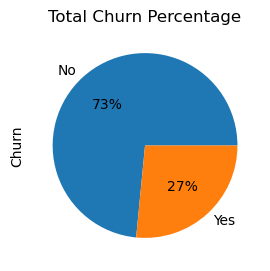

In [22]:
# Display overall % of churn
fig = plt.figure(figsize=(10,3))

# Display a frequency distribution for churn.
x = np.linspace(0,20,100)
#plt.subplot(1,2,1)
df.Churn.value_counts().plot.pie(y=df['Churn'], autopct='%1.0f%%')
plt.title('Total Churn Percentage')
#plt.setp(autotexts, size=5, weight="bold")

# # Display in bar char format
# plt.subplot(1,2,2)
# sns.countplot(x=df['Churn'])
# plt.title('Total Number of Churn Customers')
# plt.ylabel(' ')
# plt.tight_layout()
# plt.show()

In [23]:
# Create a world map to show distributions of users 
import folium
from folium.plugins import MarkerCluster
#empty map
world_map= folium.Map(tiles="cartodbpositron")
marker_cluster = MarkerCluster().add_to(world_map)
#for each coordinate, create circlemarker of user percent
for i in range(len(df)):
        lat = df.iloc[i]['Latitude']
        long = df.iloc[i]['Longitude']
        radius=5
        popup_text = """City : {}<br>"""
        popup_text = popup_text.format(df.iloc[i]['City'])
        folium.CircleMarker(location = [lat, long], radius=radius, popup= popup_text, fill =True).add_to(marker_cluster)
#show the map
world_map

In [24]:
# Remove and display columns that are highly correlated.
df = df.drop(['Customerid', 'City','Zipcode','Latitude', 'Longitude'],axis='columns')
df.head()

,Gender,Age,Married,Numberofdependents,Numberofreferrals,Tenureinmonths,Offer,Phoneservice,Avgmonthlylongdistancecharges,Multiplelines,Internetservice,Internettype,Avgmonthlygbdownload,Onlinesecurity,Onlinebackup,Deviceprotectionplan,Premiumtechsupport,Streamingtv,Streamingmovies,Streamingmusic,Unlimiteddata,Contract,Paperlessbilling,Paymentmethod,Monthlycharge,Totalcharges,Totalrefunds,Totalextradatacharges,Totallongdistancecharges,Totalrevenue,Churncategory,Churnreason,Churn
0,Female,37,Yes,0,2,9,None,Yes,42.39,No,Yes,Cable,16.0,No,Yes,No,Yes,Yes,No,No,Yes,One Year,Yes,Credit Card,65.6,593.30,0.00,0,381.51,974.81,Non churn,Non churn,No
1,Male,46,No,0,0,9,None,Yes,10.69,Yes,Yes,Cable,10.0,No,No,No,No,No,Yes,Yes,No,Month-to-Month,No,Credit Card,-4.0,542.40,38.33,10,96.21,610.28,Non churn,Non churn,No
2,Male,50,No,0,0,4,Offer E,Yes,33.65,No,Yes,Fiber Optic,30.0,No,No,Yes,No,No,No,No,Yes,Month-to-Month,Yes,Bank Withdrawal,73.9,280.85,0.00,0,134.60,415.45,Competitor,Competitor had better devices,Yes
3,Male,78,Yes,0,1,13,Offer D,Yes,27.82,No,Yes,Fiber Optic,4.0,No,Yes,Yes,No,Yes,Yes,No,Yes,Month-to-Month,Yes,Bank Withdrawal,98.0,1237.85,0.00,0,361.66,1599.51,Dissatisfaction,Product dissatisfaction,Yes
4,Female,75,Yes,0,3,3,None,Yes,7.38,No,Yes,Fiber Optic,11.0,No,No,No,Yes,Yes,No,No,Yes,Month-to-Month,Yes,Credit Card,83.9,267.40,0.00,0,22.14,289.54,Dissatisfaction,Network reliability,Yes


(-0.5, 1599.5, 799.5, -0.5)

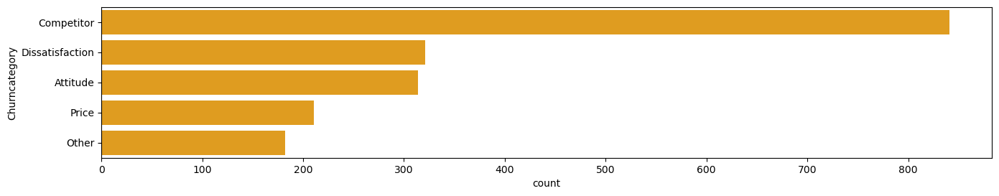

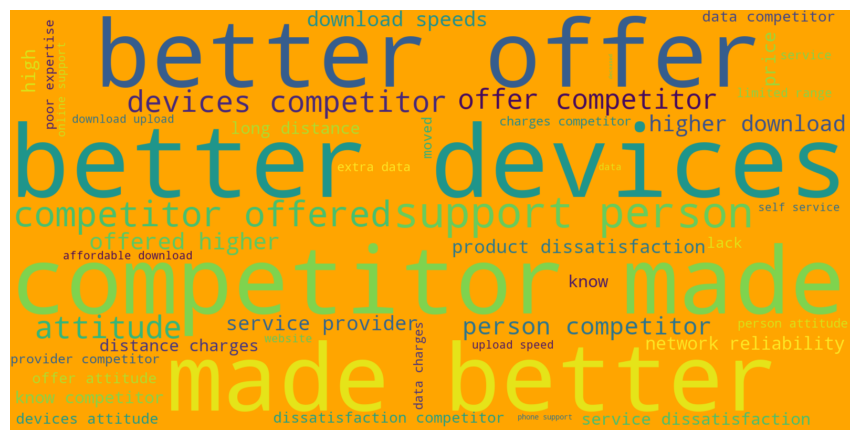

In [25]:
# Display reason for customers churn
fig = plt.figure(figsize=(16,6))

# Display the causes for churning
x = np.linspace(0,20,100)
plt.subplot(2,1,1)
df_Churncategory= df.loc[df.Churncategory !='Non churn']
sns.countplot(data = df, y = df_Churncategory['Churncategory'], order = df_Churncategory['Churncategory'].value_counts().index, color = 'orange')
#ax.set(xlabel = None, ylabel = None)

df_wd = df.loc[df['Churnreason'] != 'Non churn']
df_wd['Churnreason'] = df_wd['Churnreason'].fillna(value="")
word_string=" ".join(df_wd['Churnreason'].str.lower())
plt.figure(figsize=(12,12))
plt.subplot(2,1,2)
wc = WordCloud(background_color="orange", stopwords = STOPWORDS, max_words=2000, max_font_size= 300,  width=1600, height=800)
wc.generate(word_string)

plt.imshow(wc.recolor( colormap= 'viridis' , random_state=17), interpolation="bilinear")
plt.axis('off')

#### Identifying and storing feature and target names

In [26]:
df = df.drop(['Churncategory','Churnreason'], axis='columns')
numerical_feature = list(df.dtypes[df.dtypes !=object].index)
categorical_feature = list(df.dtypes[df.dtypes ==object].index)
target = categorical_feature.pop() #only churn
df_feature = df.drop([target], axis='columns')

#### Univariate Plots-Target count distribution (CATEGORIGAL)

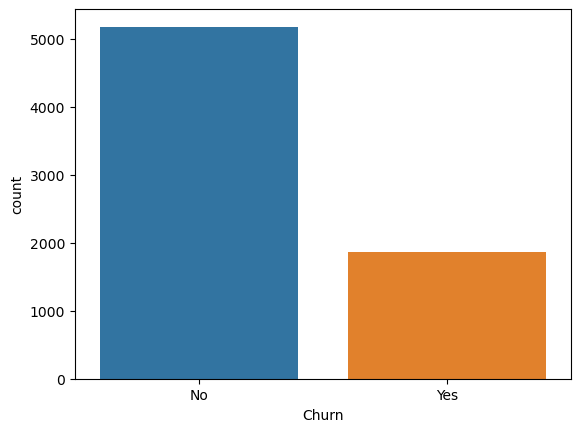

In [27]:
_ = sns.countplot(x=target, data=df)

#### Univariate Plots-Distribution of instances across distinct CATEGORIAL classes


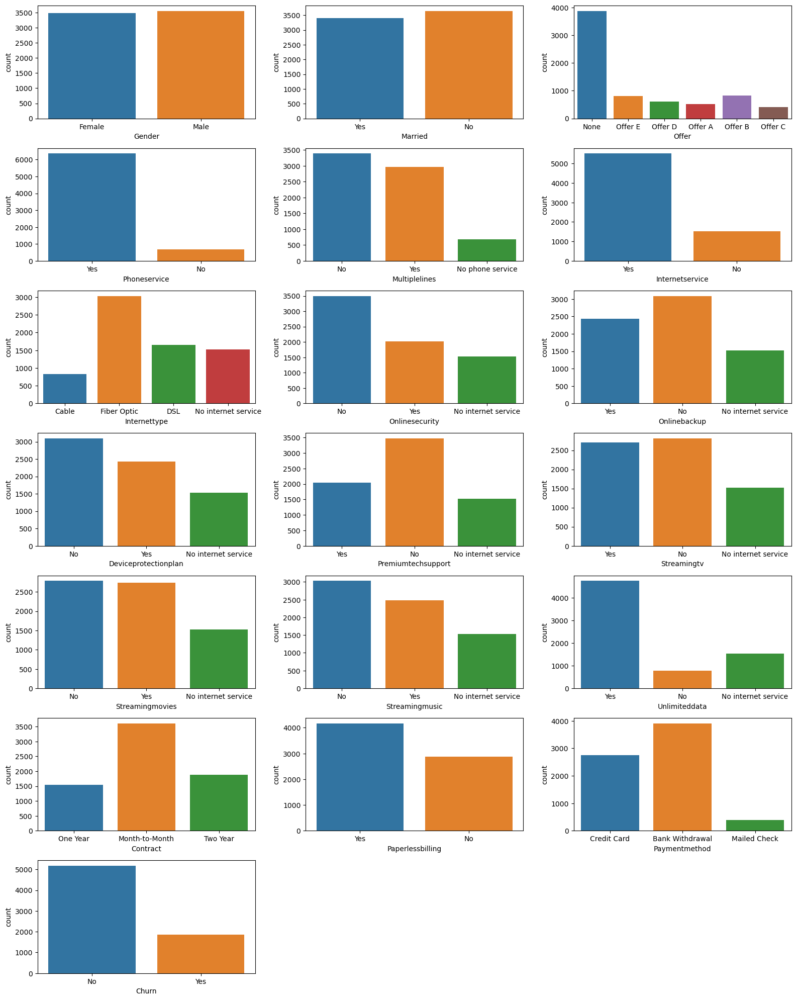

In [28]:
# plt.figure(figsize=(20,20))
# #fig, ax = plt.figure(figsize=(20,10))

# for i, categorical_feature in enumerate(categorical_feature[1:]):
#     plt.subplot(6, 3, i+1)
#     plt.xticks(fontsize=10)
#     df[categorical_feature].value_counts().plot(kind='bar')
    
# plt.tight_layout()
# plt.show()


# Data visualization on categorical features.
#df = df.drop(['churncategory','churnreason'], axis='columns')
categorical = df.select_dtypes(include="O")
#x = np.linspace(0,30,150)
plt.figure(figsize=(16,20))
for i, col in enumerate(categorical.columns):
    axes = plt.subplot(7, 3, i+1)
    #sns.countplot(x=categorical[col], hue=df["churn"])
    sns.countplot(x=categorical[col], data=df)
plt.tight_layout()
#plt.xticks(rotation=0, fontsize=14)
plt.show()

# insights:
# Churn rate for month-to-month contracts much higher that for other contract durations.
# Payment method electronic check shows much higher churn rate than other payment methods.
# Customers with InternetService fiber optic as part of their contract have much higher churn rate.

#### Univariate Plots-Histogram (NUMERICAL)

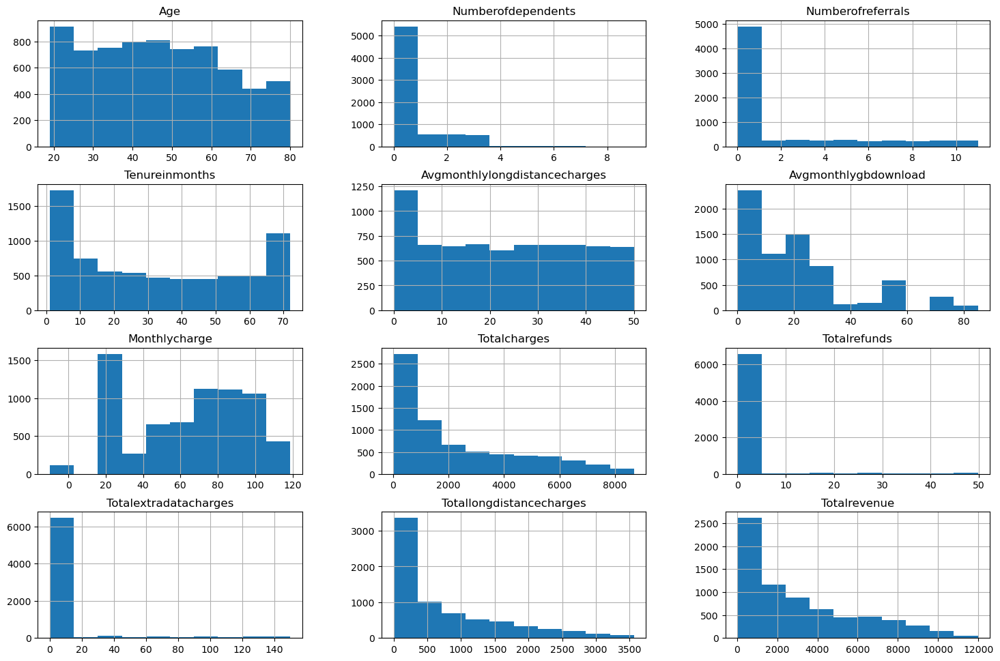

In [29]:
df_feature.hist(figsize=(18,18), layout=(6,3))
plt.show()

#### Univariate Plots-Density Plots (NUMERICAL)

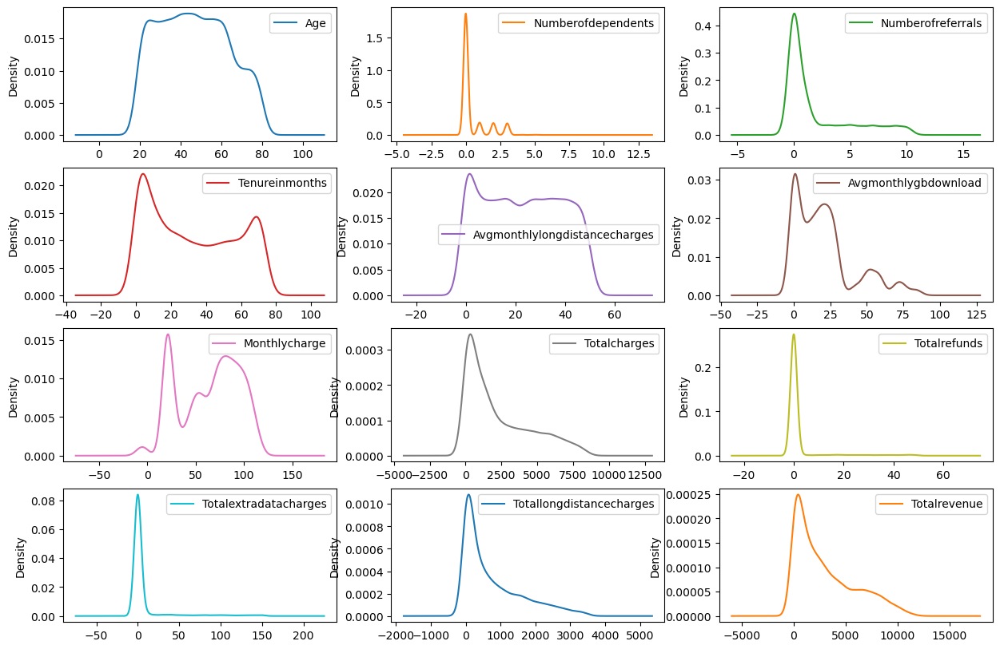

In [30]:
df_feature.plot.kde(figsize=(15,10), layout=(4,3), subplots=True, sharex=False)
plt.show()

#### Univariate Plots-Box and whisker Plots(NUMERICAL)

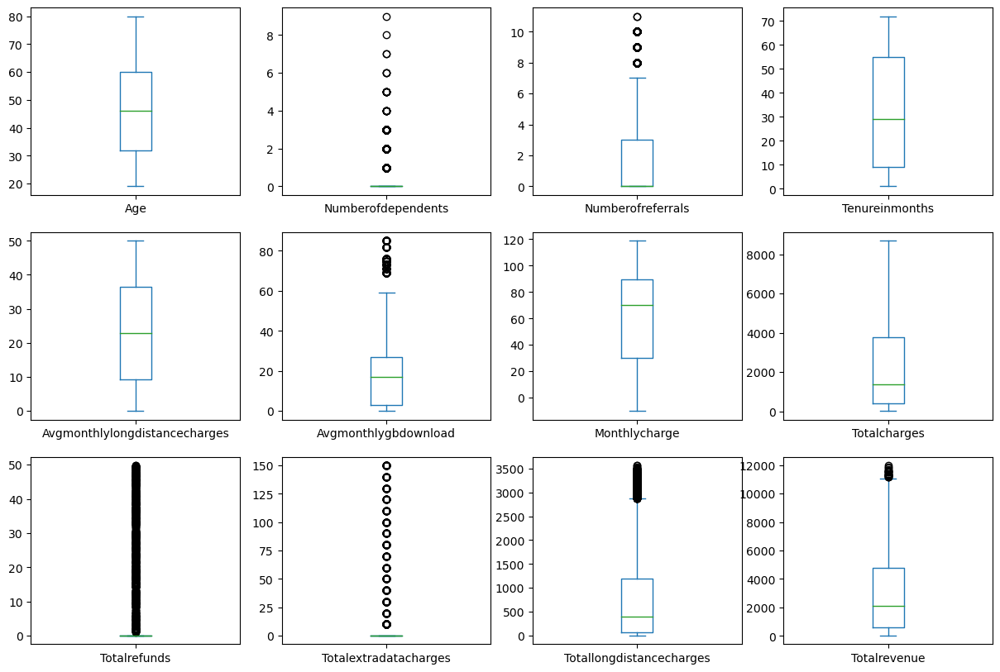

In [31]:
df_feature.plot(kind='box', figsize=(15,10), layout=(3,4), subplots=True,sharey=False)
plt.show()

#### Multivariate Plots-Correlation Matrix Plot (NUMERICAL)

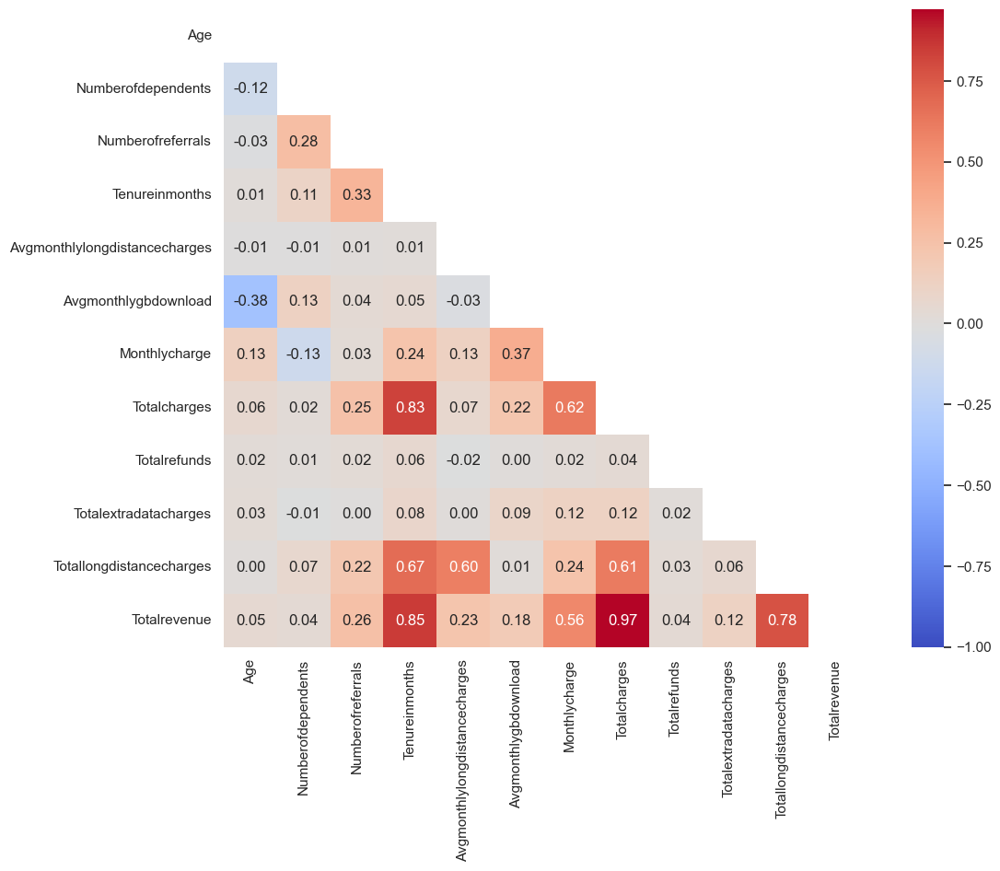

In [32]:
sns.set(style="white")

matrix = np.triu(df.corr())

fig, ax = plt.subplots(figsize=(14,9))

_ = sns.heatmap(df.corr(), mask=matrix, annot=True, annot_kws={"size": 12}, square=True, cmap='coolwarm', vmin=-1, fmt='.2f' )

#### Multivariate Plots-Scatter Plot Matrix using Seaborn Pairplot(NUMERICAL)

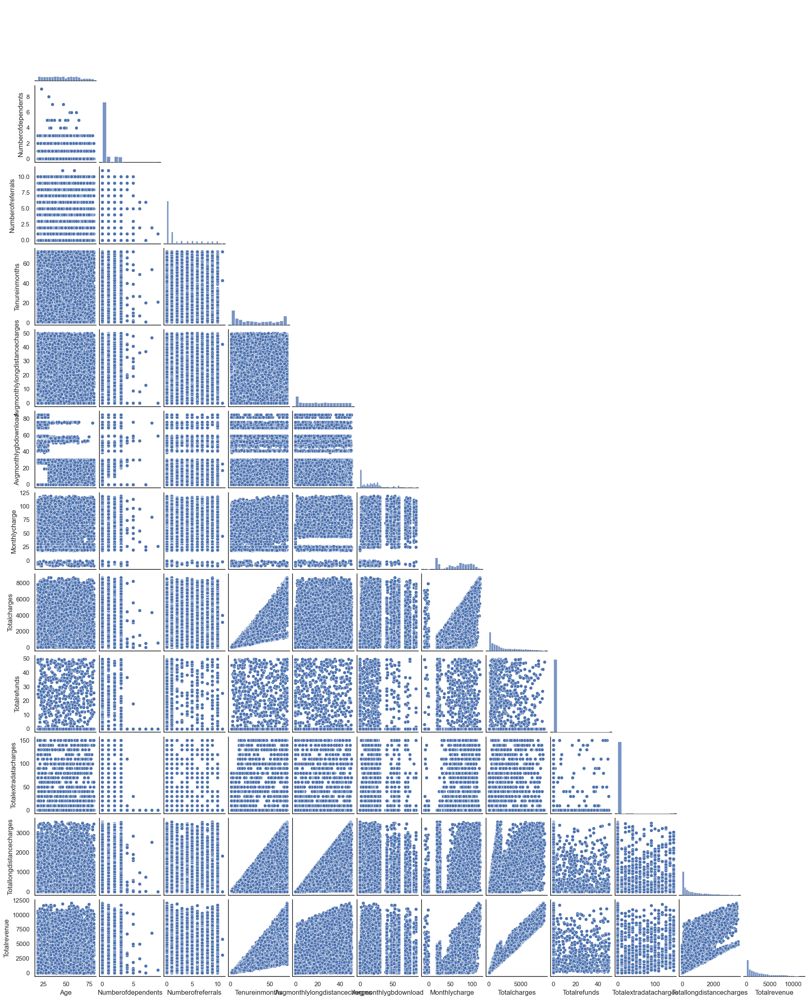

In [33]:
g = sns.pairplot(data=df, corner=True)
g.fig.set_size_inches(20,25)

#### Multivariate Plots-Distribution of CATEGORICAL features with TARGET classes

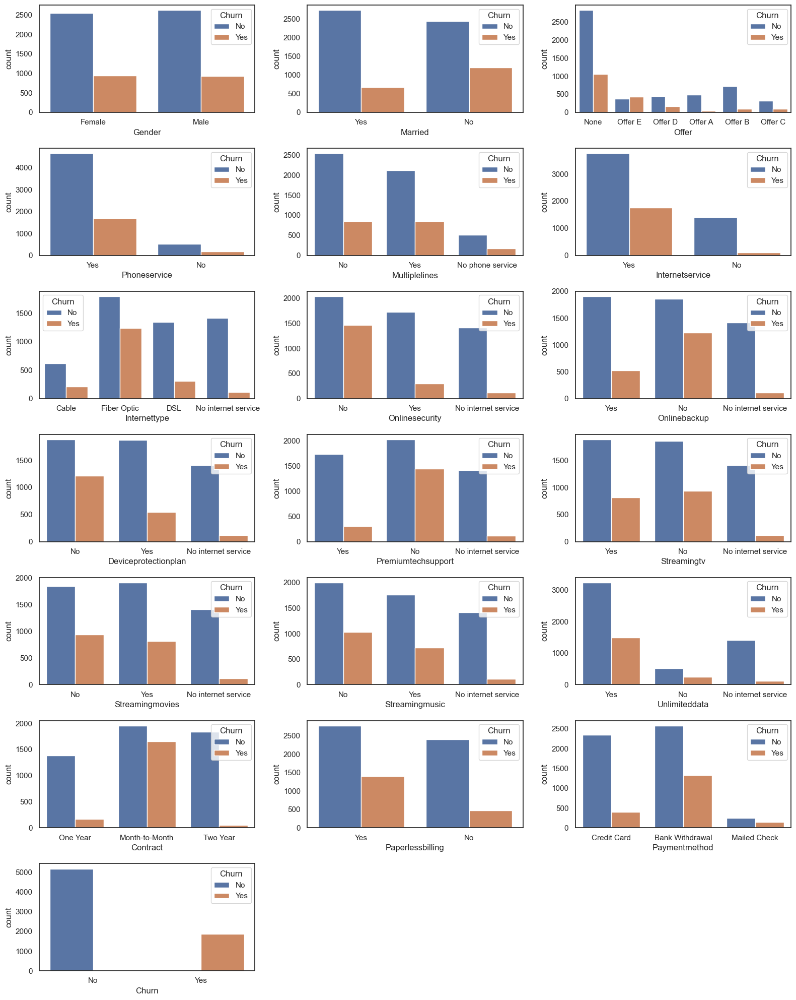

In [34]:
# plt.figure(figsize=(15,12))
# sns.set(font_scale=1.2)
# sns.set_style('ticks')

# for i, feature in enumerate(categorical_feature):
#     plt.subplot(5,4,i+1)
#     sns.countplot(x=feature,hue=target,data=df)

# sns.despine()


# Data visualization on categorical features.
#df = df.drop(['churncategory','churnreason'], axis='columns')
categorical = df.select_dtypes(include="O")
#x = np.linspace(0,30,150)
plt.figure(figsize=(16,20))
for i, col in enumerate(categorical.columns):
    axes = plt.subplot(7, 3, i+1)
    #sns.countplot(x=categorical[col], hue=df["churn"])
    sns.countplot(x=categorical[col], data=df, hue=df['Churn'])
plt.tight_layout()
#plt.xticks(rotation=0, fontsize=12)
plt.show()


#### Multivariate Plots-Histogram of NUMERICAL features vs TARGET classes

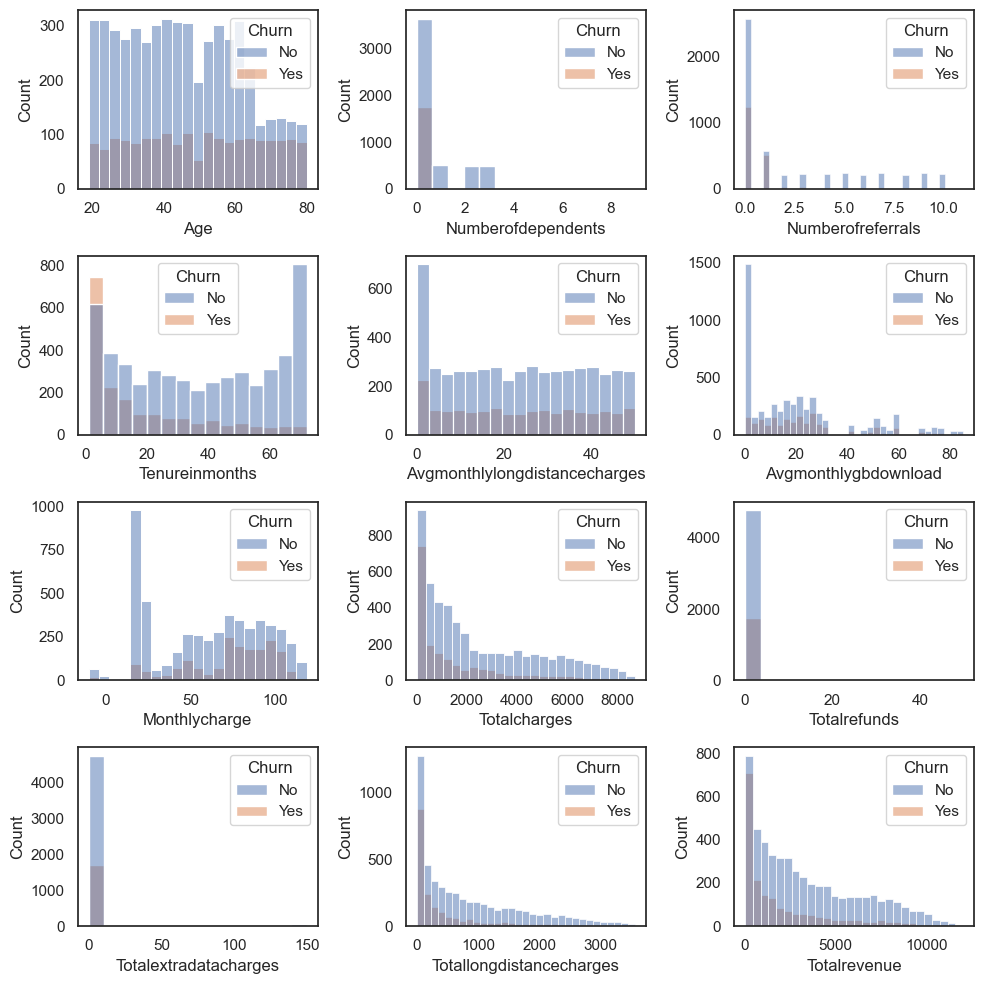

In [35]:
# sns.set_style('white')

# plt.figure(figsize=(15, 15))
# for i, feature in enumerate(numerical_feature):
#     plt.subplot(4, 3, i+1)
#     plt.hist(x=[df[feature][df[target] == 'yes'], 
#                 df[feature][df[target] == 'no']],
#              stacked=True, 
#              label=['yes', 'no'], 
#              bins=20, 
#              color=['orange', 'b'])
#     plt.legend()
#     plt.xlabel(f'{feature}', fontsize=15)
#     plt.ylabel('Count', fontsize=15)

# plt.tight_layout()


# Data visualization on numerical features
numerical = df.select_dtypes(exclude="O") #Exclude dtype='object'

plt.figure(figsize=(10,10))
for i, col in enumerate(numerical.columns):
    axes = plt.subplot(4, 3, i+1)
    sns.histplot(x=numerical[col], hue=df['Churn'], data=df)
plt.tight_layout()
#plt.xticks(rotation=20, fontsize=20)
plt.show()

# insights:
# From data visualization we can conclude that the causes of churn :
# Type of offer E is the biggest contributor to customers leaving the company, in contrast to offers A and B which make customers stayed
# People who do not use services such as Internet Service, Multiple Lines, Online Back up more chrun than stayed
# The most visible thing is that the monthly contract factor is the main cause of people churning

#### Multivariate Plots-Density plots of NUMERICAL features vs TARGET classes

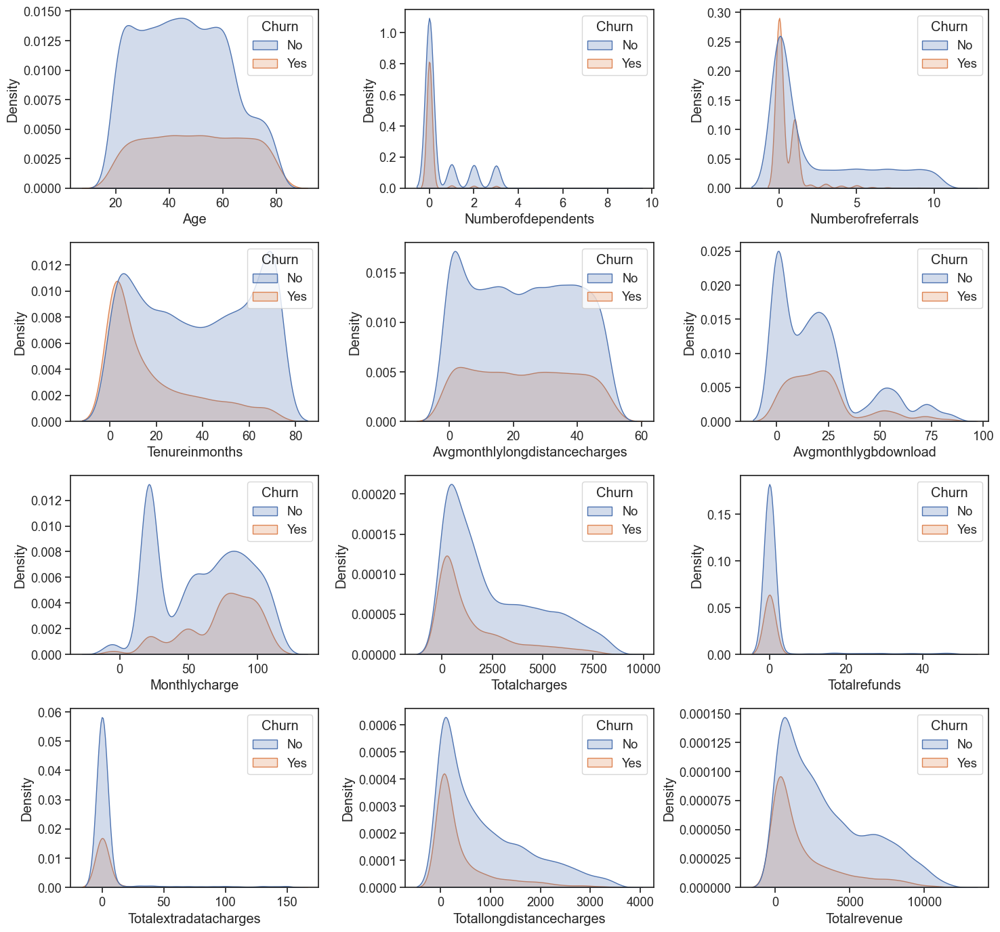

In [36]:
plt.figure(figsize=(15, 14))
sns.set(font_scale= 1.2)
sns.set_style('ticks')

for i, feature in enumerate(numerical_feature):
    plt.subplot(4, 3, i+1)
    ax = sns.kdeplot(data=df, x=df[feature], hue=target, shade=True)
    ax.set(xlabel=feature)
    
plt.tight_layout()

-----------------------------------------------------------------

## 4. Data Preparation

#### 4.1 Data Preparation - Data Cleaning

#### 4.2 Data Preparation - Feature Extration/Feature Engineering

In [37]:
numerical.columns.tolist()

['Age',
 'Numberofdependents',
 'Numberofreferrals',
 'Tenureinmonths',
 'Avgmonthlylongdistancecharges',
 'Avgmonthlygbdownload',
 'Monthlycharge',
 'Totalcharges',
 'Totalrefunds',
 'Totalextradatacharges',
 'Totallongdistancecharges',
 'Totalrevenue']

In [38]:
categorical.columns.tolist()

['Gender',
 'Married',
 'Offer',
 'Phoneservice',
 'Multiplelines',
 'Internetservice',
 'Internettype',
 'Onlinesecurity',
 'Onlinebackup',
 'Deviceprotectionplan',
 'Premiumtechsupport',
 'Streamingtv',
 'Streamingmovies',
 'Streamingmusic',
 'Unlimiteddata',
 'Contract',
 'Paperlessbilling',
 'Paymentmethod',
 'Churn']

In [39]:
# Use Label Encoder for all features with 2 unique classes
le = LabelEncoder()
for x in [i for i in df.columns if len(df[i].unique()) ==2]:
    print(x, df[x].unique())
    df[x] = le.fit_transform(df[x])

Gender ['Female' 'Male']
Married ['Yes' 'No']
Phoneservice ['Yes' 'No']
Internetservice ['Yes' 'No']
Paperlessbilling ['Yes' 'No']
Churn ['No' 'Yes']


In [40]:
# One Hot Encoding for variables with more than 2 unique classes
df = pd.get_dummies(df, columns=[i for i in df.columns if df[i].dtypes=='object'],drop_first=True)

In [41]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 7043 entries, 0 to 7042
Data columns (total 48 columns):
 #   Column                                    Non-Null Count  Dtype  
---  ------                                    --------------  -----  
 0   Gender                                    7043 non-null   int32  
 1   Age                                       7043 non-null   int64  
 2   Married                                   7043 non-null   int32  
 3   Numberofdependents                        7043 non-null   int64  
 4   Numberofreferrals                         7043 non-null   int64  
 5   Tenureinmonths                            7043 non-null   int64  
 6   Phoneservice                              7043 non-null   int32  
 7   Avgmonthlylongdistancecharges             7043 non-null   float64
 8   Internetservice                           7043 non-null   int32  
 9   Avgmonthlygbdownload                      7043 non-null   float64
 10  Paperlessbilling                    

#### 4.3 Data Preparation - Split Data (Features/Target, Training/Validation/Testing)

In [42]:
# split the data and train the model
X = df.drop('Churn', axis=1)
y = df['Churn']

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size = 0.25, stratify=y, random_state=SEED)

In [43]:
# Feature scaling(Normalization/Standardization)
scaler = StandardScaler()
scaler.fit(X_train)
X_train_scaled = scaler.transform(X_train)
X_test_scaled = scaler.transform(X_test)

##### Synthetic Minority Oversampling Technique SMOTE

<Axes: xlabel='Churn', ylabel='count'>

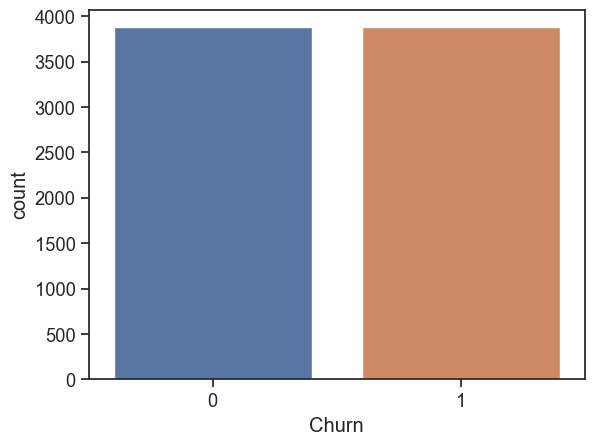

In [44]:
# Oversample with SMOTE
oversample = SMOTE()
X_trainover, y_trainover = oversample.fit_resample(X_train_scaled, y_train)
pd.Series(y_trainover).value_counts()
sns.countplot(x=y_trainover)

In [45]:
X_trainover.shape

(7760, 47)

<Axes: xlabel='Churn', ylabel='count'>

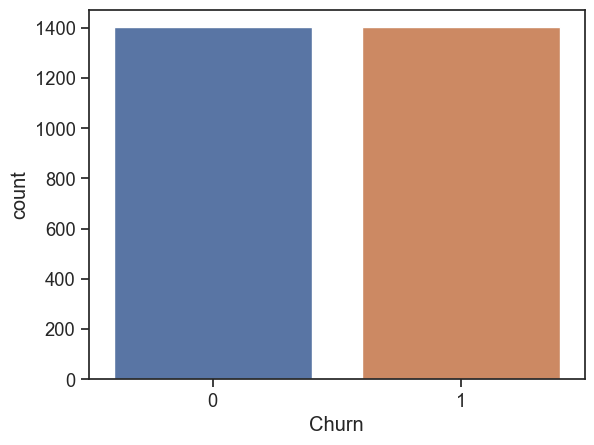

In [46]:
# Undersample with SMOTE 
undersample = RandomUnderSampler()
X_trainunder, y_trainunder = undersample.fit_resample(X_train_scaled, y_train)
pd.Series(y_trainunder).value_counts()
sns.countplot(x=y_trainunder)

In [47]:
X_trainunder.shape

(2804, 47)

<Axes: xlabel='Churn', ylabel='count'>

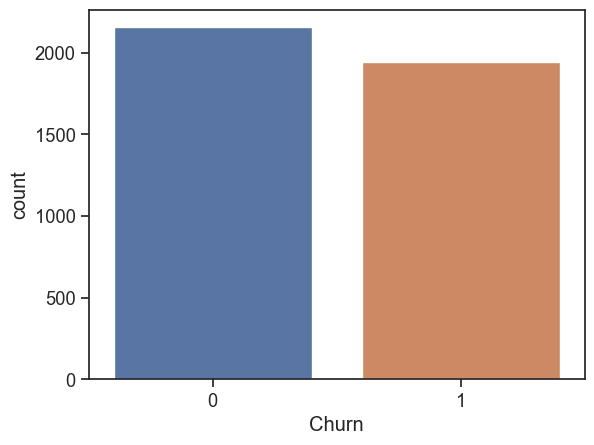

In [144]:
# Mixed, Oversample with SMOTE and random understample 
over = SMOTE(sampling_strategy=0.5)
under = RandomUnderSampler(sampling_strategy=0.9)
steps = [('o', over), ('u', under)]
pipeline = Pipeline(steps=steps)

X_trainmixed, y_trainmixed = pipeline.fit_resample(X_train_scaled, y_train)
pd.Series(y_trainmixed).value_counts()
sns.countplot(x=y_trainmixed)

In [145]:
X_trainmixed.shape

(4095, 47)

##### Feature scaling (Normalization/Standardization)

-----------------------------------------------------------------

## 5. Model Selection

#### 5.1 Model Selection - Baseline Model Training using K-fold Cross Validation

In [146]:
%%time
lr_baseline = LogisticRegression(random_state=SEED)

scores = cross_val_score(lr_baseline,
                        X_trainmixed,
                        y_trainmixed,
                        scoring='accuracy',
                        cv=5,
                        n_jobs=-1)

CPU times: total: 15.6 ms
Wall time: 402 ms


In [147]:
baseline_mean_score = scores.mean()
print("Baseline Model's score: {:.2f} (avg) {:.2f} (std)".format(scores.mean(), scores.std()))

lr_baseline.fit(X_trainmixed, y_trainmixed)
lr_y_pred = lr_baseline.predict(X_test_scaled)
print(classification_report(y_test, lr_y_pred))

Baseline Model's score: 0.81 (avg) 0.03 (std)
              precision    recall  f1-score   support

           0       0.93      0.79      0.85      1294
           1       0.59      0.83      0.69       467

    accuracy                           0.80      1761
   macro avg       0.76      0.81      0.77      1761
weighted avg       0.84      0.80      0.81      1761



#### Model 2 - RandomForest

In [148]:
# Initialize and train the machine learning model
rf_classifier = RandomForestClassifier()
rf_classifier.fit(X_trainmixed, y_trainmixed)

RandomForestClassifier()

In [149]:
# Predict and Evaluate the model
rf_y_pred = rf_classifier.predict(X_test_scaled)

In [150]:
#Classification Report
print(classification_report(y_test,rf_y_pred))

              precision    recall  f1-score   support

           0       0.90      0.84      0.87      1294
           1       0.63      0.74      0.68       467

    accuracy                           0.82      1761
   macro avg       0.77      0.79      0.78      1761
weighted avg       0.83      0.82      0.82      1761



Text(43.25, 0.5, 'Predicted')

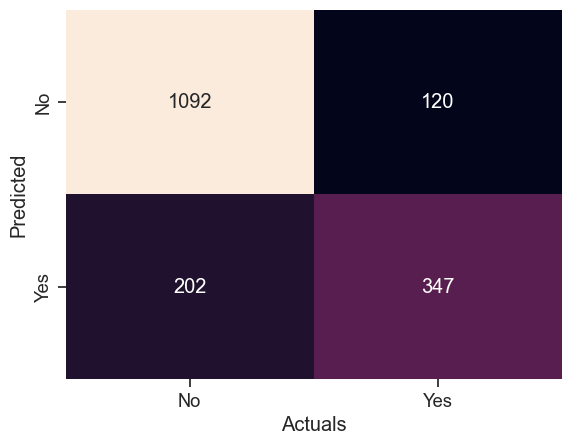

In [151]:
# Confustion Matrix

conf_mat = confusion_matrix(y_test, rf_y_pred)
#conf_mat = confusion_matrix(y_test, lr_y_pred)
sns.heatmap(conf_mat.T, annot=True, fmt='d', cbar=False, 
            xticklabels=['No', 'Yes',],
           yticklabels=['No','Yes'])
plt.xlabel('Actuals')
plt.ylabel('Predicted')

In [152]:
# Creating the feature importances dataframe
#feature_importance = np.array(rf_classifier.feature_importances_)
feature_importance = np.array(rf_classifier.feature_importances_)
feature_names = np.array(X.columns)

feat_imp = pd.DataFrame({'feature_names':feature_names, 'feature_importance':feature_importance})
feat_imp_sorted = feat_imp.sort_values('feature_importance', ascending=False)

Text(0.5, 1.0, 'Feature Importance')

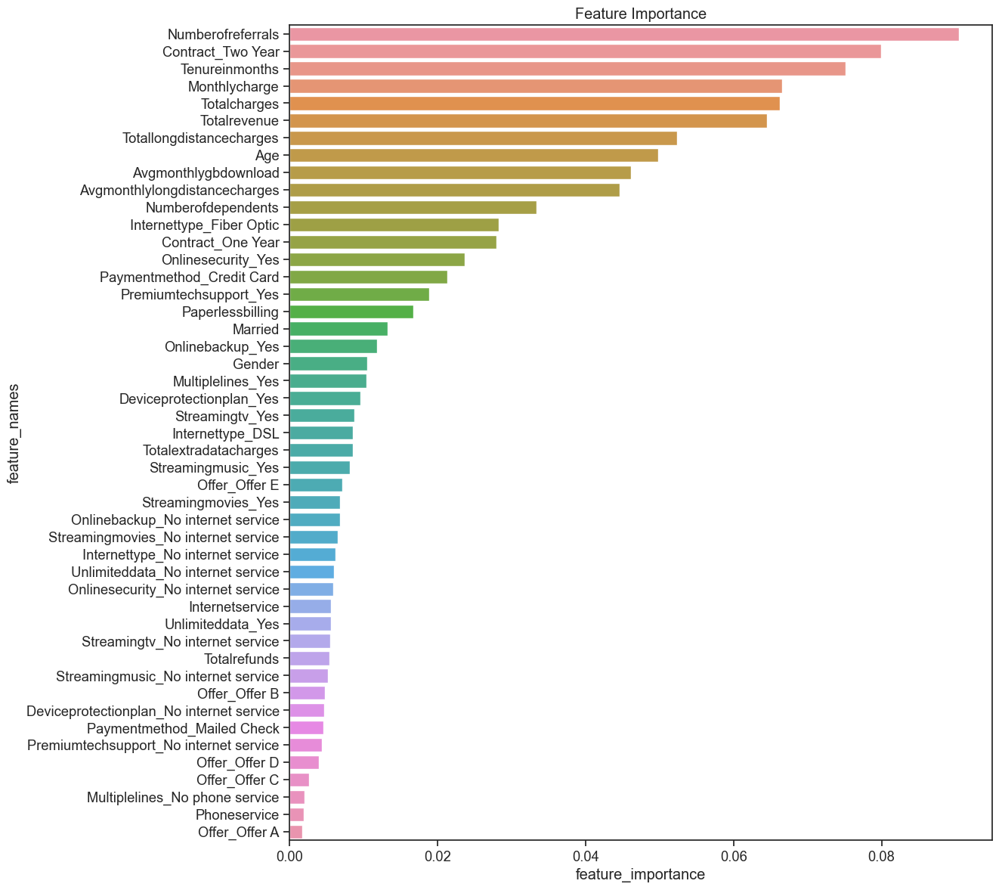

In [153]:
plt.figure(figsize=(12,14))
sns.barplot(x=feat_imp_sorted['feature_importance'], y=feat_imp_sorted['feature_names'])
plt.title('Feature Importance')

#### 5.2 Model Selection - Multiple Model Evaluation and Comparison

In [154]:
# Prepare models
model_df = pd.DataFrame({
    'ID':['LR','KNN','GB','SVM','DT','RF','XGB','GDB', 'ADA','MLP'],
    'Name':['Linear Regression', 'K-nearest Neighbour','Gaussian Naive Bayes','Support Vector Machine','Decision Tree', 
            'Random Forest','XGBoost','Gradient Boosting','Ada Boost','Multi-layer Perceptron'],
    'Estimator':[LogisticRegression(random_state=SEED),KNeighborsClassifier(),GaussianNB(),SVC(random_state=SEED), 
                 DecisionTreeClassifier(random_state=SEED, class_weight='balanced'),RandomForestClassifier(random_state=SEED), 
                 XGBClassifier(random_state=SEED),GradientBoostingClassifier(random_state=SEED), 
                 AdaBoostClassifier(random_state=SEED),MLPClassifier(random_state=SEED)]})

model_df['Results'] = 0
model_df['Mean_score'] = 0
model_df['Time_taken'] = 0
model_df

,ID,Name,Estimator,Results,Mean_score,Time_taken
0,LR,Linear Regression,LogisticRegression(random_state=41),0,0,0
1,KNN,K-nearest Neighbour,KNeighborsClassifier(),0,0,0
2,GB,Gaussian Naive Bayes,GaussianNB(),0,0,0
3,SVM,Support Vector Machine,SVC(random_state=41),0,0,0
4,DT,Decision Tree,DecisionTreeClassifier(class_weight='balanced'...,0,0,0
5,RF,Random Forest,RandomForestClassifier(random_state=41),0,0,0
6,XGB,XGBoost,"XGBClassifier(base_score=None, booster=None, c...",0,0,0
7,GDB,Gradient Boosting,GradientBoostingClassifier(random_state=41),0,0,0
8,ADA,Ada Boost,AdaBoostClassifier(random_state=41),0,0,0
9,MLP,Multi-layer Perceptron,MLPClassifier(random_state=41),0,0,0


In [155]:
%%time
# List to temporarily store collected results
results = []
time_taken = []

# evaluate each model in turn
for ID, estimator in model_df[['ID', 'Estimator']].values:
    start_time = time.process_time()
    cv_results = cross_val_score(estimator, 
                                X_trainmixed,
                                y_trainmixed,
                                cv=5,
                                n_jobs=-1)
    elapsed_time = time.process_time() - start_time
    
    results.append(cv_results)
    time_taken.append(elapsed_time)
    
    msg = "{:3}: Mean score {:.4f} (Std {:.4f}) - ({:.2f} s)".format(ID, cv_results.mean(), cv_results.std(), elapsed_time)
    print(msg)

LR : Mean score 0.8149 (Std 0.0265) - (0.02 s)
KNN: Mean score 0.7680 (Std 0.0247) - (0.02 s)
GB : Mean score 0.7751 (Std 0.0130) - (0.02 s)
SVM: Mean score 0.8315 (Std 0.0234) - (0.02 s)
DT : Mean score 0.7875 (Std 0.0467) - (0.02 s)
RF : Mean score 0.8440 (Std 0.0365) - (0.02 s)
XGB: Mean score 0.8376 (Std 0.0442) - (0.02 s)
GDB: Mean score 0.8371 (Std 0.0372) - (0.03 s)
ADA: Mean score 0.8181 (Std 0.0360) - (0.02 s)
MLP: Mean score 0.8298 (Std 0.0405) - (0.02 s)
CPU times: total: 203 ms
Wall time: 26.9 s


In [156]:
# saving collected results
model_df['Results'] = results
model_df['Mean_score'] = [s.mean() for s in results]
model_df['Time_taken'] = time_taken

In [157]:
# save a copy of results sorted by 'Mean Score'
model_df_sorted = model_df.sort_values('Mean_score', ascending=False)
model_df_sorted

,ID,Name,Estimator,Results,Mean_score,Time_taken
5,RF,Random Forest,RandomForestClassifier(random_state=41),"[0.8217338217338217, 0.8095238095238095, 0.831...",0.843956,0.015625
6,XGB,XGBoost,"XGBClassifier(base_score=None, booster=None, c...","[0.8095238095238095, 0.7985347985347986, 0.827...",0.837607,0.015625
7,GDB,Gradient Boosting,GradientBoostingClassifier(random_state=41),"[0.8144078144078144, 0.8034188034188035, 0.824...",0.837118,0.031250
3,SVM,Support Vector Machine,SVC(random_state=41),"[0.8217338217338217, 0.8034188034188035, 0.821...",0.831502,0.015625
9,MLP,Multi-layer Perceptron,MLPClassifier(random_state=41),"[0.796092796092796, 0.7948717948717948, 0.8253...",0.829792,0.015625
8,ADA,Ada Boost,AdaBoostClassifier(random_state=41),"[0.8083028083028083, 0.7777777777777778, 0.802...",0.818071,0.015625
0,LR,Linear Regression,LogisticRegression(random_state=41),"[0.8241758241758241, 0.7924297924297924, 0.789...",0.814896,0.015625
4,DT,Decision Tree,DecisionTreeClassifier(class_weight='balanced'...,"[0.7326007326007326, 0.7643467643467643, 0.782...",0.787546,0.015625
2,GB,Gaussian Naive Bayes,GaussianNB(),"[0.7680097680097681, 0.7619047619047619, 0.774...",0.775092,0.015625
1,KNN,K-nearest Neighbour,KNeighborsClassifier(),"[0.7533577533577533, 0.7423687423687424, 0.764...",0.768010,0.015625


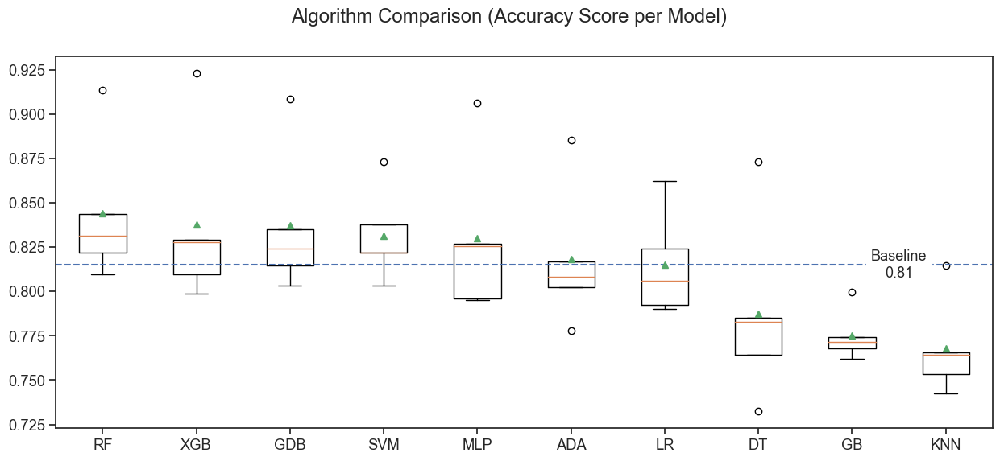

In [158]:
# boxplot algorithm comparison - sorted by mean score

fig = plt.figure(figsize=(15,6))
fig.suptitle('Algorithm Comparison (Accuracy Score per Model)')

ax = fig.add_subplot(111)
plt.boxplot(model_df_sorted['Results'], showmeans=True)
ax.set_xticklabels(model_df_sorted['ID'])

plt.axhline(y=baseline_mean_score, linestyle='--')
baseline_text = f"Baseline\n{baseline_mean_score:.2f}"
baseline_text_xpos = len(results) - 0.5

plt.text(x=baseline_text_xpos, y=baseline_mean_score, s=baseline_text,
        fontsize=13, va='center', ha='center', backgroundcolor='w')
plt.show()

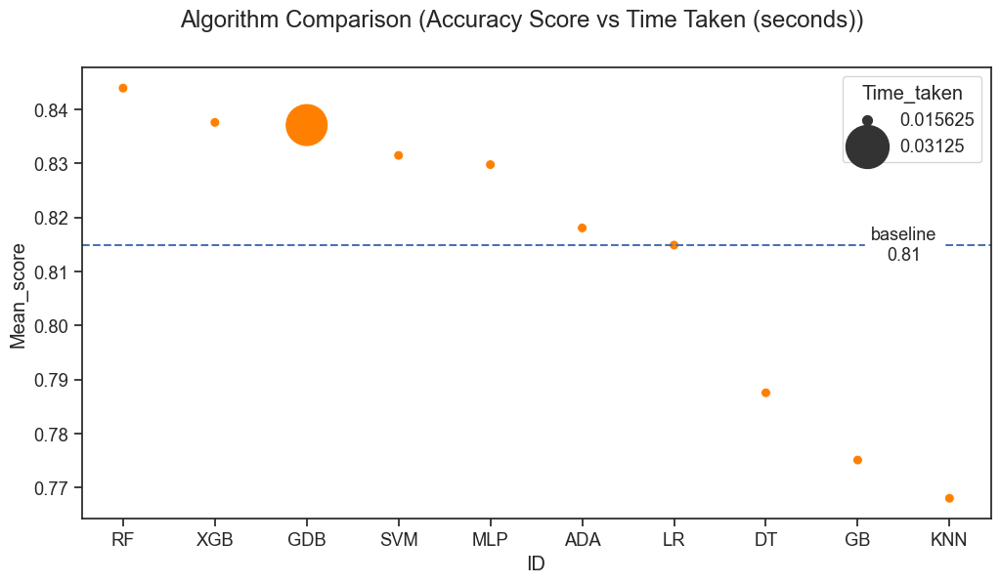

In [159]:
# scatter plot algoritm comparison - sorted mean score, where bubble size is proportional to time taken
# with this chart, we can look at trade off between performance vs time-constraint.
# we can make a better judgement call on which would be the best model(s) to choose
# for hyperparameter fine-tuning task.

fig = plt.figure(figsize=(12,6))
fig.suptitle('Algorithm Comparison (Accuracy Score vs Time Taken (seconds))')
sns.scatterplot(data=model_df_sorted, x='ID', y='Mean_score', size='Time_taken',
               sizes=(50,1000), color='#FF8000')

plt.axhline(y=baseline_mean_score, linestyle='--')
baseline_text = f"baseline\n{baseline_mean_score:.2f}"
baseline_text_xpos = len(results) - 1.5

plt.text(x=baseline_text_xpos, y=baseline_mean_score, s=baseline_text,
        fontsize=13, va='center', ha='center', backgroundcolor='w')

plt.show()

#### 5.3 Model Selection - Improving the Final Model(s)

##### Hyperparameter fine-tuning with Gradient Boosting

In [160]:
%%time
# Hyperparameter fine-tuning for GradientBoosting
parameters = {'learning_rate': [0.05, 0.1, 0.15],
              'n_estimators': [100, 400, 600]}

gs_clf = GridSearchCV(GradientBoostingClassifier(random_state=SEED),
                     parameters,
                     cv=5,
                     scoring='accuracy',
                     n_jobs=-1)

_ = gs_clf.fit(X_trainmixed, y_trainmixed)

print(gs_clf.best_estimator_)
print(gs_clf.best_params_)
print(gs_clf.best_score_)
print()

GradientBoostingClassifier(n_estimators=400, random_state=41)
{'learning_rate': 0.1, 'n_estimators': 400}
0.8383394383394384

CPU times: total: 10.2 s
Wall time: 2min 38s


##### Hyperparameter fine_tuning with Logistic Regression

##### Hyperparameter fine-tuning with Support Vector Machine

##### Hyperparameter fine-tuning with Random Forest

In [161]:
%%time
# Hyperparameter fine-tuning for Random Forest
parameters = {'n_estimators': [400, 600, 800],
              'min_samples_split': [3, 5, 10]}

gs_clf = GridSearchCV(RandomForestClassifier(oob_score=True, n_jobs=-1, random_state=SEED),
                     parameters,
                     cv=5,
                     scoring='accuracy',
                     n_jobs=-1)

_ = gs_clf.fit(X_trainmixed, y_trainmixed)

print(gs_clf.best_estimator_)
print(gs_clf.best_params_)
print(gs_clf.best_score_)
print()

RandomForestClassifier(min_samples_split=3, n_estimators=400, n_jobs=-1,
                       oob_score=True, random_state=41)
{'min_samples_split': 3, 'n_estimators': 400}
0.843956043956044

CPU times: total: 8.17 s
Wall time: 2min 5s


##### Hyperparameter fine-tuning with XGB

#### 5.4 Model Selection - Evaluate the final, fine_tuned Model

In [162]:
# save a version copy of the trained model with the best result
final_clf = gs_clf.best_estimator_
final_clf

RandomForestClassifier(min_samples_split=3, n_estimators=400, n_jobs=-1,
                       oob_score=True, random_state=41)

In [163]:
# use the model to check if it will generalize well with unseen data - testing dataset
finalrf_y_pred = final_clf.predict(X_test_scaled)

In [164]:
# evaluate via relevant metrics on how well the model can perform with unseen data
accuracy = accuracy_score(y_test, finalrf_y_pred)

print('Final Model ({})'.format(final_clf.__class__.__name__))
print('-'*60)
print(classification_report(y_test, finalrf_y_pred, target_names=le.classes_))

Final Model (RandomForestClassifier)
------------------------------------------------------------
              precision    recall  f1-score   support

          No       0.91      0.85      0.88      1294
         Yes       0.64      0.76      0.70       467

    accuracy                           0.82      1761
   macro avg       0.77      0.80      0.79      1761
weighted avg       0.84      0.82      0.83      1761



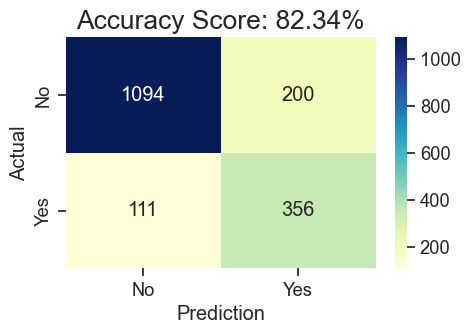

In [165]:
# display confusion matrix to visualize model performance
cm = confusion_matrix(y_test, finalrf_y_pred)
conf_matrix = pd.DataFrame(data=cm)

plt.figure(figsize = (5,3))
labels = le.classes_
sns.heatmap(conf_matrix, annot=True, fmt='d', cmap='YlGnBu', xticklabels=labels, yticklabels=labels)

# print the scores on training and test set
cm_title = 'Accuracy Score: {:.2%}'.format(accuracy)
_=plt.title(cm_title, size=19)
_=plt.xlabel('Prediction')
_=plt.ylabel('Actual')

In [166]:
# Creating the feature importances dataframe
feature_importance = np.array(rf_classifier.feature_importances_)
feature_names = np.array(X.columns)

feat_imp = pd.DataFrame({'feature_names':feature_names, 'feature_importance':feature_importance})
feat_imp_sorted = feat_imp.sort_values('feature_importance', ascending=False)

Text(0.5, 1.0, 'Feature Importance')

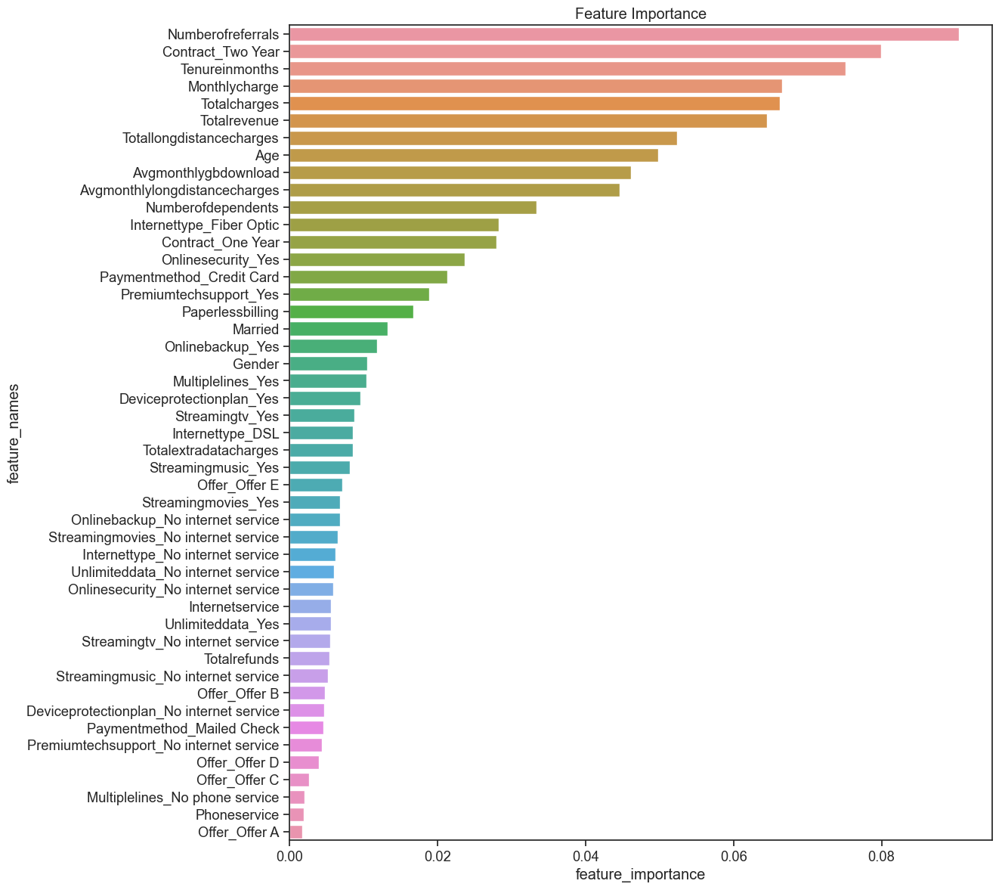

In [167]:
plt.figure(figsize=(12,14))
sns.barplot(x=feat_imp_sorted['feature_importance'], y=feat_imp_sorted['feature_names'])
plt.title('Feature Importance')

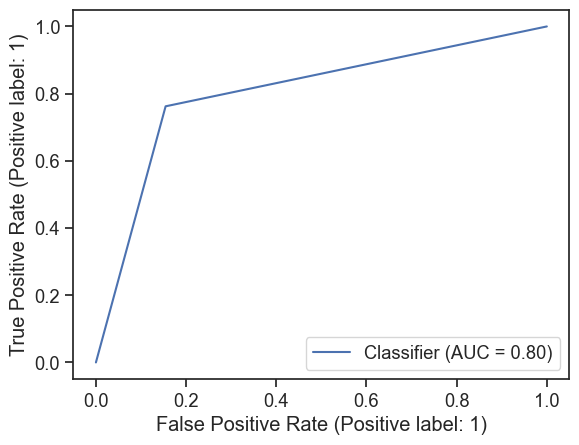

In [168]:
_ = RocCurveDisplay.from_predictions(y_test, finalrf_y_pred)

In [169]:
sample_indices = np.random.choice(range(len(X_test_scaled)), 10)

X_test_sample = X_test_scaled[sample_indices, ]
y_test_sample = y_test.iloc[sample_indices, ]

y_pred_sample = final_clf.predict(X_test_sample)

print("{:^10} {:^10}".format('Actual', 'Predict'))
print('-'*25)
for i in range(len(sample_indices)):
    print("{:^10} {:^10}".format(le.classes_[y_test_sample.iloc[i]],
                                le.classes_[y_pred_sample[i]]))

  Actual    Predict  
-------------------------
    No        Yes    
   Yes        Yes    
    No         No    
    No         No    
    No         No    
    No         No    
    No         No    
    No         No    
    No         No    
    No        Yes    


In [170]:
# save model using pickle
from pickle import dump, load

# save the model to disk
filename = 'finalized_model.sav'
dump(final_clf, open(filename, 'wb'))

In [171]:
# load the model from disk
final_clf = load(open(filename, 'rb'))

# cursory check on the score
final_clf.score(X_test_scaled, y_test)

0.8233957978421351

-----------------------------------------------------------------